In [2]:
import cv2
import numpy as np
import PIL
import os
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

In [3]:
IMAGE_DIR = "MI01"
MASKS_DIR = f"{IMAGE_DIR}/Masks"
IMAGES_DIR = f"{IMAGE_DIR}/Images"

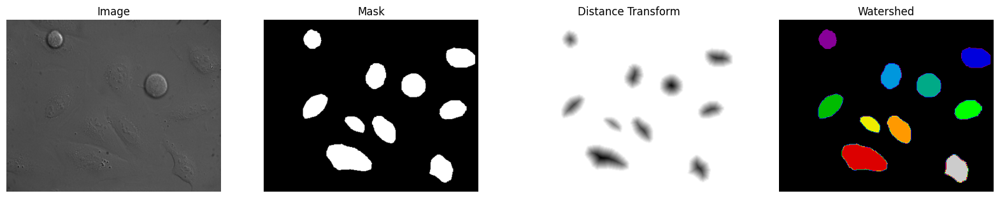

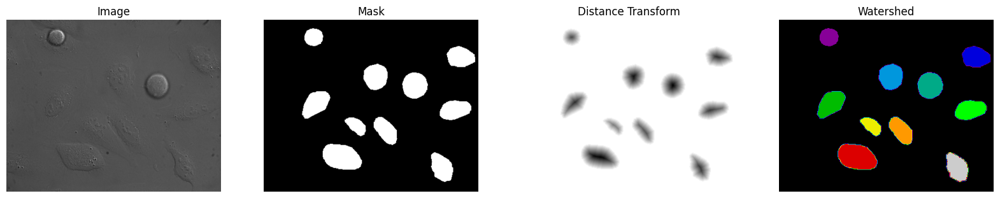

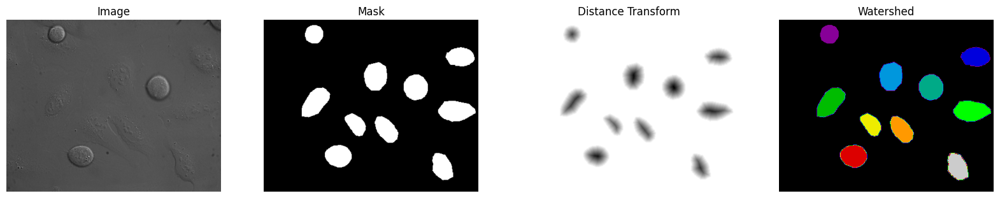

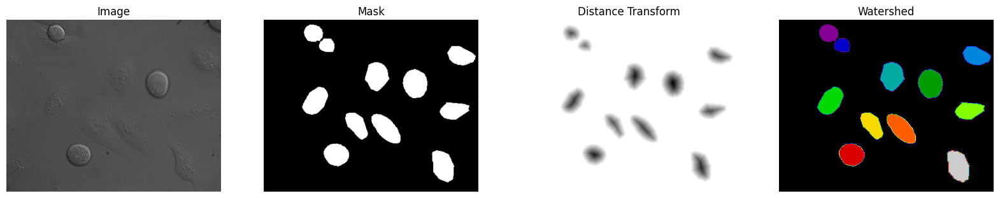

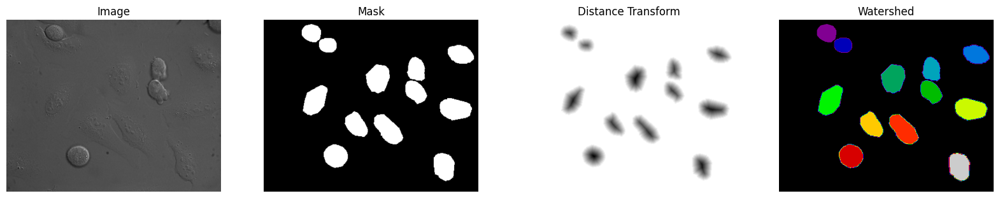

...

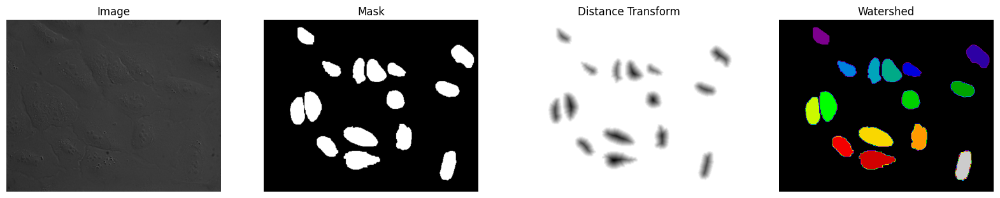

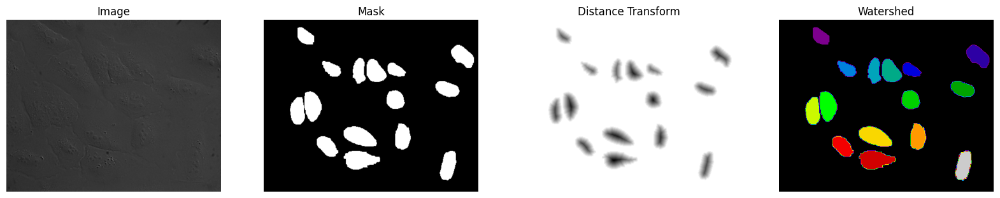

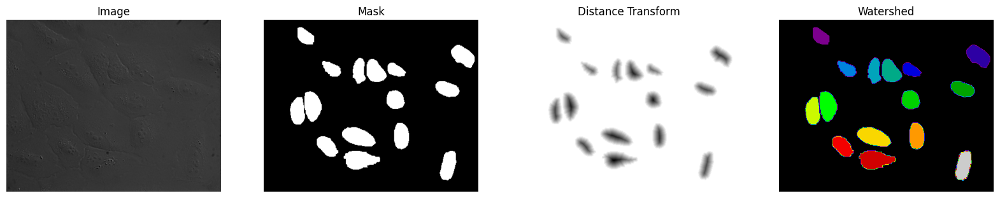

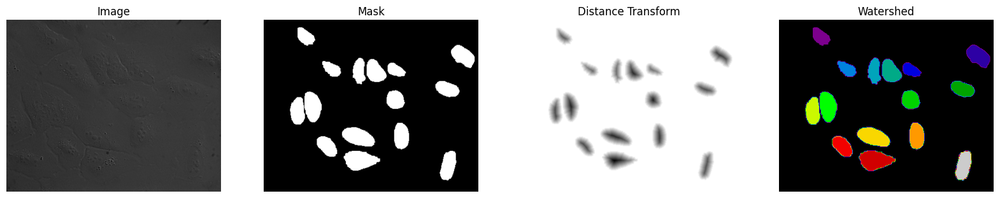

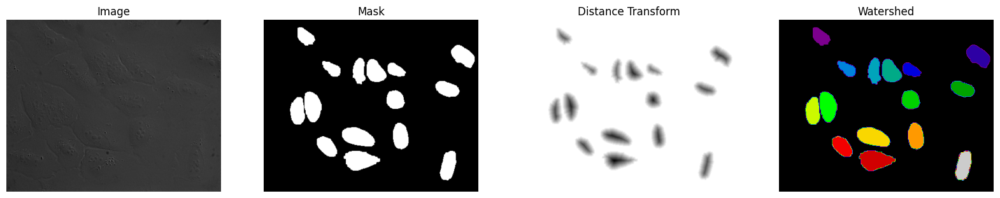

In [7]:
watershed_video_labels = []
watershed_video_markers = []
for img in os.listdir(MASKS_DIR):
    
    image = cv2.imread(f"{IMAGES_DIR}/I{img[1:]}")
    
    mask_img = cv2.imread(f"{MASKS_DIR}/{img}")
    mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(mask_img,0,1,cv2.THRESH_BINARY)
    mask = np.array(thresh, dtype=bool)
    
    distance_transform = ndi.distance_transform_edt(mask)
    coords = peak_local_max(distance_transform, min_distance=40)
    watershed_mask = np.zeros(distance_transform.shape, dtype=bool)
    watershed_mask[tuple(coords.T)] = True
    markers, _ = ndi.label(watershed_mask)
    
    watershed_labels = watershed(-distance_transform, markers, mask=mask, watershed_line=False)
    
    watershed_video_labels.append(watershed_labels)
    watershed_video_markers.append(markers)
    # watershed_labels = watershed_labels.squeeze()
    
    fig, ax = plt.subplots(1, 4, figsize=(20,15))
    ax[0].imshow(image, cmap='grey')
    ax[0].set_title("Image")
    ax[0].axis('off')
    ax[1].imshow(mask, cmap='grey')
    ax[1].set_title("Mask")
    ax[1].axis('off')
    ax[2].imshow(-distance_transform, cmap=plt.cm.gray)
    ax[2].set_title("Distance Transform")
    ax[2].axis('off')
    ax[3].imshow(watershed_labels, cmap=plt.cm.nipy_spectral)
    ax[3].set_title("Watershed")
    ax[3].axis('off')
    
    plt.show()